In [1]:
import os 
import matplotlib.pyplot as plt
import numpy as np
import json
from PIL import Image
import pandas as pd
import pickle

01-smiling


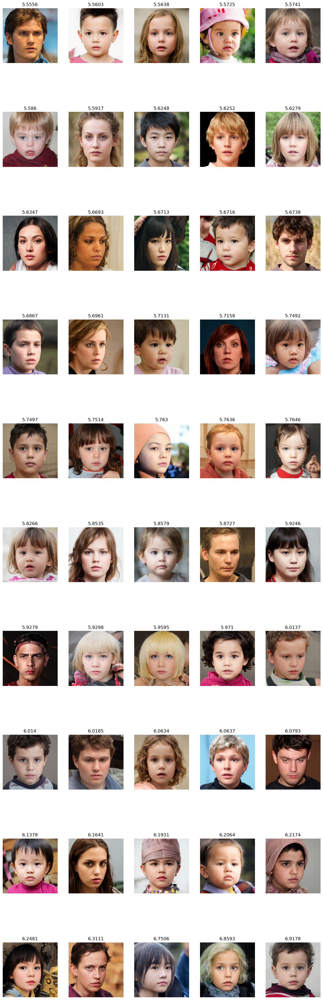

In [2]:
base = 'selected'
for folder in os.listdir('selected'):
    log_path = os.path.join(base , folder , 'logits.json')
    with open(log_path , 'r') as fi:
        logits = json.load(fi)
    logits = sorted(logits.items() , key= lambda x : x[1])
    row_size = 5
    col_size = len(logits) // 5
    image_resolution = 128
    
    print(folder)
    plt.figure(figsize=(15,5*(len(logits))), dpi= 100 ,facecolor='white')
    for i in range(len(logits)):
        plt.subplot(len(logits),row_size,i+1)
        plt.axis('off')
        plt.title(round(float(logits[i][1]) , 4))
        plt.imshow(Image.open(os.path.join(base ,folder, f'{logits[i][0]}.png')))
        
    
    plt.show()
    break
        
    


In [6]:
a =pd.read_csv('npy/celeba-hq/attribute')

In [7]:
a.keys()

Index(['00-male', '01-smiling', '02-attractive', '03-wavy-hair', '04-young',
       '05-5-o-clock-shadow', '06-arched-eyebrows', '07-bags-under-eyes',
       '08-bald', '09-bangs', '10-big-lips', '11-big-nose', '12-black-hair',
       '13-blond-hair', '14-blurry', '15-brown-hair', '16-bushy-eyebrows',
       '17-chubby', '18-double-chin', '19-eyeglasses', '20-goatee',
       '21-gray-hair', '22-heavy-makeup', '23-high-cheekbones',
       '24-mouth-slightly-open', '25-mustache', '26-narrow-eyes',
       '27-no-beard', '28-oval-face', '29-pale-skin', '30-pointy-nose',
       '31-receding-hairline', '32-rosy-cheeks', '33-sideburns',
       '34-straight-hair', '35-wearing-earrings', '36-wearing-hat',
       '37-wearing-lipstick', '38-wearing-necklace', '39-wearing-necktie'],
      dtype='object')

In [2]:
with open('npy/ffhq/S' , 'rb') as f:
    f_s = pickle.load(f)
    
with open('npy/celeba-hq/S' , 'rb') as f:
    c_s = pickle.load(f)
    

In [9]:
f_s

2

In [29]:
[i.shape for i in c_s[1]]

[(10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 512),
 (10000, 256),
 (10000, 256),
 (10000, 256),
 (10000, 128),
 (10000, 128),
 (10000, 128),
 (10000, 64),
 (10000, 64),
 (10000, 64),
 (10000, 32),
 (10000, 32)]

In [3]:
mixxx = [np.concatenate((f_s[1][i], c_s[1][i])) for i in range(len(c_s[1]))]
mixxx = [c_s[0] , mixxx]
mixxx[0]

['G_synthesis_1/4x4/Conv/add:0',
 'G_synthesis_1/4x4/ToRGB/add:0',
 'G_synthesis_1/8x8/Conv0_up/add:0',
 'G_synthesis_1/8x8/Conv1/add:0',
 'G_synthesis_1/8x8/ToRGB/add:0',
 'G_synthesis_1/16x16/Conv0_up/add:0',
 'G_synthesis_1/16x16/Conv1/add:0',
 'G_synthesis_1/16x16/ToRGB/add:0',
 'G_synthesis_1/32x32/Conv0_up/add:0',
 'G_synthesis_1/32x32/Conv1/add:0',
 'G_synthesis_1/32x32/ToRGB/add:0',
 'G_synthesis_1/64x64/Conv0_up/add:0',
 'G_synthesis_1/64x64/Conv1/add:0',
 'G_synthesis_1/64x64/ToRGB/add:0',
 'G_synthesis_1/128x128/Conv0_up/add:0',
 'G_synthesis_1/128x128/Conv1/add:0',
 'G_synthesis_1/128x128/ToRGB/add:0',
 'G_synthesis_1/256x256/Conv0_up/add:0',
 'G_synthesis_1/256x256/Conv1/add:0',
 'G_synthesis_1/256x256/ToRGB/add:0',
 'G_synthesis_1/512x512/Conv0_up/add:0',
 'G_synthesis_1/512x512/Conv1/add:0',
 'G_synthesis_1/512x512/ToRGB/add:0',
 'G_synthesis_1/1024x1024/Conv0_up/add:0',
 'G_synthesis_1/1024x1024/Conv1/add:0',
 'G_synthesis_1/1024x1024/ToRGB/add:0']

In [4]:
os.system('mkdir npy/celeba-hq_ffhq')

256

In [5]:
from GetCode import GetCodeMS

In [6]:
with open('npy/celeba-hq_ffhq/S' , 'wb') as f:
    pickle.dump(mixxx , f)
    
with open('npy/celeba-hq_ffhq/S_mean_std' , 'wb') as f:
    m,std=GetCodeMS(mixxx[1])
    save_tmp=[m,std]
    print([s.shape for s in save_tmp[0]])
    pickle.dump(save_tmp , f)

[(512,), (512,), (512,), (512,), (512,), (512,), (512,), (512,), (512,), (512,), (512,), (512,), (512,), (512,), (512,), (256,), (256,), (256,), (128,), (128,), (128,), (64,), (64,), (64,), (32,), (32,)]


In [39]:
c_s = None
f_s = None

In [40]:
mixxx = None

In [10]:
f_att = pd.read_csv('npy/ffhq/attribute')
c_att = pd.read_csv('npy/celeba-hq/attribute')


In [30]:
tmp = pd.DataFrame(c_att.values, index=[i + len(f_att) for i in range(len(c_att))])
tmp.columns = c_att.columns
tmp

,00-male,01-smiling,02-attractive,03-wavy-hair,04-young,05-5-o-clock-shadow,06-arched-eyebrows,07-bags-under-eyes,08-bald,09-bangs,...,30-pointy-nose,31-receding-hairline,32-rosy-cheeks,33-sideburns,34-straight-hair,35-wearing-earrings,36-wearing-hat,37-wearing-lipstick,38-wearing-necklace,39-wearing-necktie
20000,6.899703,-4.044750,-1.994281,-0.839925,-3.285519,4.250103,-0.637697,0.755109,9.583635,6.711702,...,-0.087851,4.025958,2.329567,5.428082,0.223498,1.206682,4.948923,-3.156241,0.225702,5.391927
20001,7.523196,0.696907,-2.854727,-1.118610,-3.307461,9.583057,-1.264403,2.837394,2.858034,5.385805,...,0.070364,3.712690,3.968164,6.388874,1.521128,1.385182,4.219338,-2.723465,0.170561,6.411364
20002,0.773432,0.082424,2.153910,1.897083,-0.386838,3.524241,-0.426585,-0.150321,3.009963,5.390468,...,1.595482,-0.473505,3.531539,3.933767,1.038115,1.117011,3.210430,-0.252065,1.738438,2.607800
20003,1.541248,3.395338,-0.853977,0.138266,-1.691293,4.080294,2.248522,1.297937,7.018476,4.140329,...,0.839812,3.836441,3.397353,5.990897,0.693311,2.429368,4.081553,0.586936,1.043188,2.692985
20004,-4.869251,-3.897002,2.329949,3.156195,0.619307,0.692923,1.559719,-0.988461,2.232571,8.019841,...,2.707553,-0.066041,5.413897,4.276828,1.844303,1.592062,0.019595,4.374702,2.299424,1.713943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,2.459944,2.732783,-0.354599,0.127908,-0.262900,3.079236,0.244358,0.233058,4.701303,-0.504808,...,0.649737,4.643200,4.653365,6.826281,0.537146,0.191919,3.422554,0.539050,1.705164,5.794068
29996,-2.264764,3.971733,0.530837,1.401499,-1.252044,1.397233,2.434428,2.716555,5.108088,3.922774,...,1.188517,2.587375,4.130309,6.315280,0.771625,1.578173,2.847549,0.979903,0.956699,2.661789
29997,-6.808423,4.772887,0.237235,1.083675,-1.031230,-0.471474,0.527024,0.262648,9.981092,6.493302,...,0.331536,4.913792,4.137915,3.990377,-0.138689,3.055419,3.456563,4.924737,2.787796,1.367122
29998,4.369936,4.278108,-1.485189,-0.399167,-1.964522,5.475842,1.955870,2.612611,6.988461,2.314141,...,-0.281825,5.417473,1.420234,7.991230,-0.312258,1.828711,3.620917,-2.001673,0.228885,6.106263


In [37]:
fc_att = pd.concat((f_att,tmp))
fc_att.to_csv('npy/celeba-hq_ffhq/attribute')

In [5]:
with open('npy/celeba-hq_ffhq/S_mean_std' , 'rb') as f:
    fc_s_mstd = pickle.load(f)

In [11]:
fc_s_mstd[1]

[array([ 1.8687766 ,  0.7410447 ,  0.51635104,  1.105571  ,  1.853546  ,
         1.7220279 ,  1.7888845 ,  1.0540864 ,  0.90349483,  0.983975  ,
         1.3494556 ,  1.1806576 ,  0.78896356,  1.1467671 ,  0.54547286,
         1.4269344 ,  0.64472216,  1.4193538 ,  0.9951157 ,  1.672538  ,
         0.97110176,  0.87293375,  0.5459225 ,  1.7116795 ,  1.7329189 ,
         0.7061776 ,  1.7079402 ,  0.5835906 ,  1.343385  ,  1.1787319 ,
         0.7372263 ,  0.92717737,  0.96565795,  1.3287469 ,  1.1000559 ,
         1.5550636 ,  0.65491843,  1.2819465 ,  1.2276846 ,  1.0059382 ,
         1.4290599 ,  1.3306179 ,  1.2578355 ,  1.5755615 ,  1.323228  ,
         1.0261015 ,  1.6307839 ,  0.7733985 ,  1.8420043 ,  0.6874827 ,
         0.9714744 ,  0.8299867 ,  1.3304772 ,  1.4681159 ,  0.7446257 ,
         1.3605492 ,  1.0525217 ,  1.2180029 ,  0.58498967,  0.7060825 ,
         0.8137588 ,  1.6676606 ,  1.0434848 ,  0.8998956 ,  0.73785204,
         0.9212601 ,  0.88738436,  1.7512422 ,  0.7

In [20]:
np.concatenate([np.abs(fc_s_mstd[1][i] - f_s_mstd[1][i]) for i in range(len(f_s_mstd[1]))])

(9088,)

In [38]:
fc_att=None
c_att=None
f_att=None

In [13]:
f_w = np.load('npy/ffhq/W.npy')
c_w = np.load('npy/celeba-hq/W.npy')

In [14]:
tmp = f_w[:,None,:]
tmp.shape
f_w = np.tile(tmp, (1,18,1))

In [8]:
c_w.shape

(10000, 18, 512)

In [18]:
fc_w = np.concatenate((f_w,c_w) , axis=0)

In [19]:
f_w == fc_w[:20000,:,:]

array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  Tr

In [22]:
np.save( 'npy/celeba-hq_ffhq/W.npy',fc_w)

In [3]:
c_i = np.load('npy/celeba-hq/images.npy')
f_i = np.load('npy/ffhq/images.npy')

In [5]:
tmp = np.concatenate((f_i,c_i) , axis=0)
tmp.shape

(30000, 256, 256, 3)

In [8]:
np.save('npy/celeba-hq_ffhq/images.npy',tmp)

In [7]:
c_i = None
f_i = None

The history saving thread hit an unexpected error (OperationalError('database or disk is full',)).History will not be written to the database.


10-big-lips


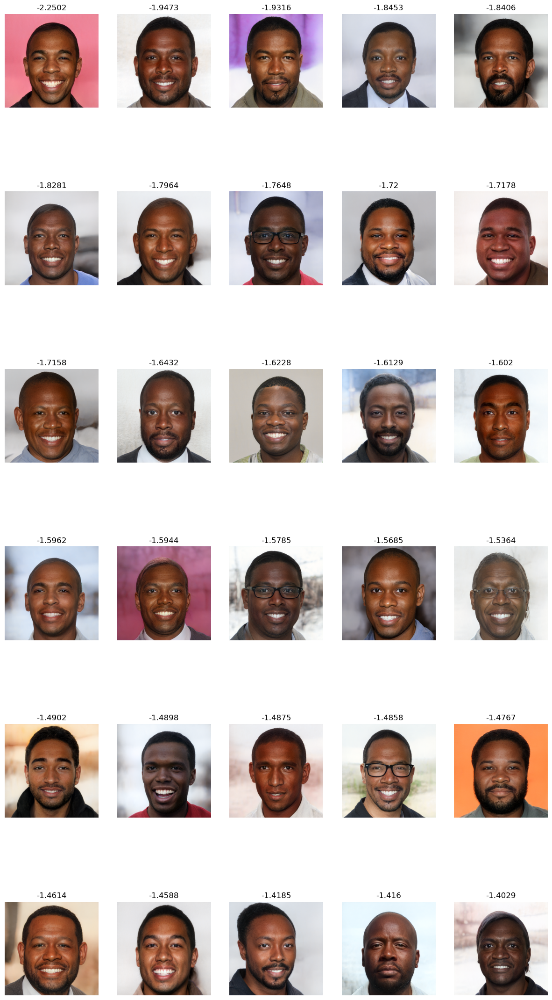

In [20]:
base='selected/celeba-hq_ffhq_celeba-hq_ffhq'
# for folder in os.listdir('selected/celeba-hq_ffhq_celeba-hq_ffhq'):
folder = "10-big-lips"
log_path = os.path.join(base , folder , 'logits.json')
with open(log_path , 'r') as fi:
    logits = json.load(fi)
logits = sorted(logits.items() , key= lambda x : x[1])
row_size = 5
col_size = len(logits) // 5
image_resolution = 128

print(folder)
plt.figure(figsize=(15,5*(len(logits))), dpi= 100 ,facecolor='white' )
for i in range(len(logits)):
    plt.subplot(len(logits),row_size,i+1)
    plt.axis('off')
    plt.title(round(float(logits[i][1]) , 4))
    plt.imshow(Image.open(os.path.join(base ,folder, f'{logits[i][0]}.png')))

plt.show()

10-big-lips


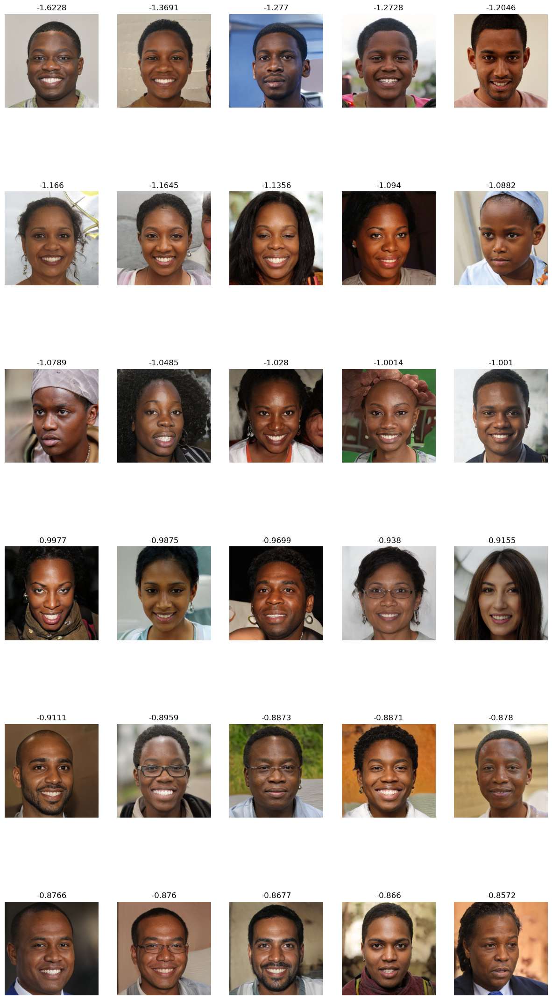

In [14]:
base='selected/ffhq_ffhq'
# for folder in os.listdir('selected/celeba-hq_ffhq_celeba-hq_ffhq'):
folder = "10-big-lips"
log_path = os.path.join(base , folder , 'logits.json')
with open(log_path , 'r') as fi:
    logits = json.load(fi)
logits = sorted(logits.items() , key= lambda x : x[1])
row_size = 5
col_size = len(logits) // 5
image_resolution = 128

print(folder)
plt.figure(figsize=(15,5*(len(logits))), dpi= 100 ,facecolor='white' )
for i in range(len(logits)):
    plt.subplot(len(logits),row_size,i+1)
    plt.axis('off')
    plt.title(round(float(logits[i][1]) , 4))
    plt.imshow(Image.open(os.path.join(base ,folder, f'{logits[i][0]}.png')))


plt.show()

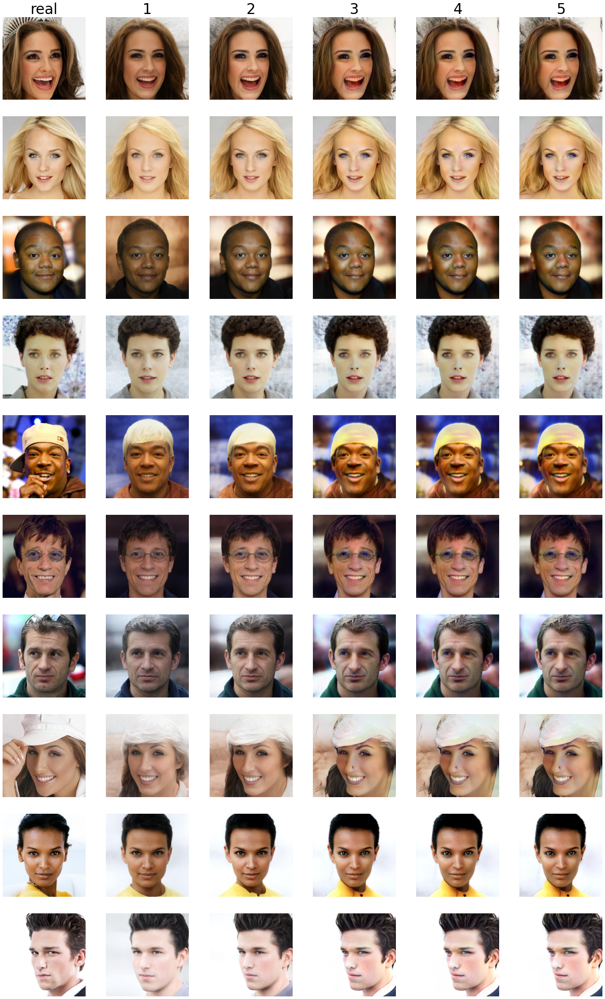

In [13]:
base = 'restyle-encoder-sample-results_e4e'
all_ent = os.listdir('restyle-encoder-sample-results_e4e')
files = list(filter(lambda i: os.path.isfile(os.path.join(base,i)) , all_ent))
folders = list(filter(lambda i: os.path.isdir(os.path.join(base,i)) , all_ent))
iter_num = 5 + 1
row_size = iter_num
col_size = 1 + len(files) // row_size 
image_resolution = 64
plt.figure(figsize=(30,5*(len(files))), dpi= 50)
for j,file in enumerate(files):
    image_path = os.path.join(base, file)
    plt.subplot(len(files),row_size,j * row_size + 1)
    plt.axis('off')
    if j == 0:
        plt.title("real" , fontsize=40)
    plt.imshow(Image.open(image_path))
    for i , folder in enumerate(folders[:5]):
        image_path = os.path.join(base , folder , file)
        plt.subplot(len(files),row_size,j * row_size + i +2)
        plt.axis('off')
        if j == 0:
            plt.title(i + 1,fontsize=40)
        plt.imshow(Image.open(image_path))
        
plt.show()

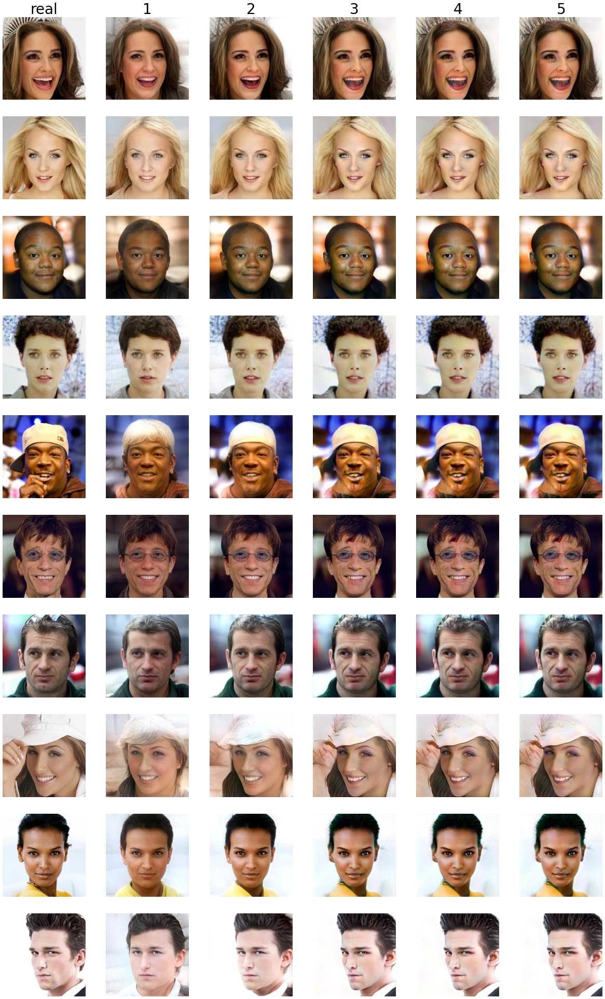

In [14]:
base = "restyle-encoder-sample-results-psp"
all_ent = os.listdir(base)
files = list(filter(lambda i: os.path.isfile(os.path.join(base,i)) , all_ent))
folders = list(filter(lambda i: os.path.isdir(os.path.join(base,i)) , all_ent))
iter_num = 5 + 1
row_size = iter_num
col_size = 1 + len(files) // row_size 
image_resolution = 64
plt.figure(figsize=(30,5*(len(files))), dpi= 50)
for j,file in enumerate(files):
    image_path = os.path.join(base, file)
    plt.subplot(len(files),row_size,j * row_size + 1)
    plt.axis('off')
    if j == 0:
        plt.title("real" , fontsize=40)
    plt.imshow(Image.open(image_path))
    for i , folder in enumerate(folders[:5]):
        image_path = os.path.join(base , folder , file)
        plt.subplot(len(files),row_size,j * row_size + i +2)
        plt.axis('off')
        if j == 0:
            plt.title(i + 1,fontsize=40)
        plt.imshow(Image.open(image_path))
        
plt.show()